In [1]:
import qutip as qt
import numpy as np
import matplotlib.pyplot as plt
import scqubits as scq
import pandas as pd

%matplotlib widget

In [48]:
ratio = 70
Ec = 0.25
Ej = Ec*ratio
N = 10 # number of levels in charge basis
ng = 0.5

T_max = 250
T1 = 50
T2 = 100

P0=0.99
R0 = 100 * np.pi

def hamiltonian(Ec, Ej, N, ng):
    """
    Return the charge qubit hamiltonian as a Qobj instance.
    """
    m = np.diag(4 * Ec * (np.arange(-N,N+1)-ng)**2) + 0.5 * Ej * (np.diag(-np.ones(2*N), 1) + 
                                                               np.diag(-np.ones(2*N), -1))
                                                               
    return qt.Qobj(m)

def Hc(Ec, N, ng):
    
    m = np.diag(4 * Ec * (np.arange(-N,N+1)-ng)**2) 
    
    return qt.Qobj(m)

def Hj(Ej, N, ng):
    
    m = 0.5 * Ej * (np.diag(-np.ones(2*N), 1) + np.diag(-np.ones(2*N), -1))
    
    return qt.Qobj(m)

H_c = Hc(Ec=Ec, N=N, ng = ng)
H_j = Hj(Ej=Ej, N=N, ng=ng)

H_tot = hamiltonian(Ec, Ej, N, ng)
def EJ_tanh_pulse(t, P0, R0, T):
    return (1-P0*(1+np.tanh(-R0+(t/T)*2*R0))/2.0)

def EJ_double_pulse(t, P0, R0, T1, T2):
    return EJ_tanh_pulse(t, P0, R0, T1) + (EJ_tanh_pulse(t - T2, -P0, R0, T1) - 1)

# Time depenedent part (drive) of Hamiltonian



def Hd_coeff(t,args):
    Percentage=args['P0']
    Range=args['R0']
    T1=args['T1']
    T2=args['T2']
    return EJ_double_pulse(t, Percentage, Range, T1, T2)



In [71]:
Points=10000
tlist = np.linspace(0, T_max, Points)
H_tot_tdep = [H_c, [H_j, Hd_coeff]]
evals, ekets = H_tot.eigenstates()

psi0 = ekets[0]
n_op = (1j/np.sqrt(2 * np.sqrt((4*Ec)/(Ej/2)))) *(qt.destroy(2*N+1) - qt.create(2*N+1))
p_op = np.sqrt(np.sqrt((4*Ec)/(Ej/2))/(2)) * (qt.destroy(2*N+1) + qt.create(2*N+1))
result = qt.mesolve(H_tot_tdep, psi0, tlist, c_ops=[], e_ops=[n_op, p_op] , args={'P0':P0, 'R0':R0, 'T1':T1, 'T2':T2},  progress_bar=True)

se_out =  qt.sesolve(H_tot_tdep, psi0, tlist, args={'P0':P0, 'R0':R0, 'T1':T1, 'T2':T2}, progress_bar=True)

Ovrlp0=np.zeros(Points)
for n in range(0,Points):
   Ovrlp0[n]=np.abs(psi0.dag().overlap(se_out.states[n]))**2

10.0%. Run time:   0.95s. Est. time left: 00:00:00:08
20.0%. Run time:   1.59s. Est. time left: 00:00:00:06
30.0%. Run time:   2.24s. Est. time left: 00:00:00:05
40.0%. Run time:   2.80s. Est. time left: 00:00:00:04
50.0%. Run time:   3.37s. Est. time left: 00:00:00:03
60.0%. Run time:   3.99s. Est. time left: 00:00:00:02
70.0%. Run time:   4.56s. Est. time left: 00:00:00:01
80.0%. Run time:   5.17s. Est. time left: 00:00:00:01
90.0%. Run time:   5.93s. Est. time left: 00:00:00:00
Total run time:   6.54s
10.0%. Run time:   0.45s. Est. time left: 00:00:00:04
20.0%. Run time:   0.96s. Est. time left: 00:00:00:03
30.0%. Run time:   1.53s. Est. time left: 00:00:00:03
40.0%. Run time:   2.08s. Est. time left: 00:00:00:03
50.0%. Run time:   2.70s. Est. time left: 00:00:00:02
60.0%. Run time:   3.33s. Est. time left: 00:00:00:02
70.0%. Run time:   4.03s. Est. time left: 00:00:00:01
80.0%. Run time:   4.71s. Est. time left: 00:00:00:01
90.0%. Run time:   5.30s. Est. time left: 00:00:00:00
Tota

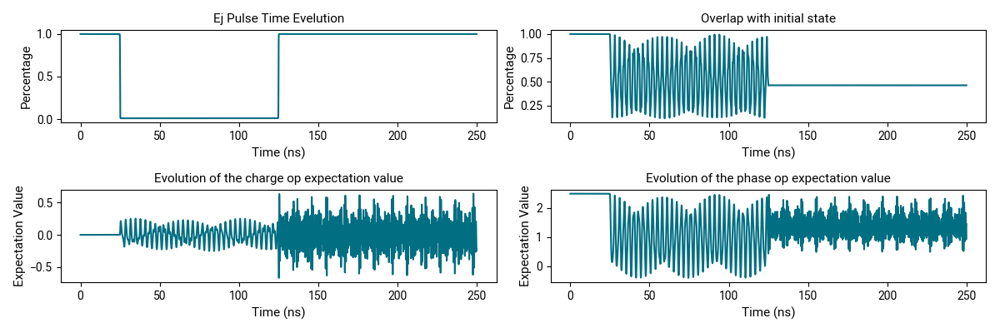

In [72]:
plt.close()
fig, ax = plt.subplots(2, 2, figsize= (12,4))
ax[0,1].plot(tlist, Ovrlp0)
ax[0,1].set_xlabel("Time (ns)")
ax[0,1].set_ylabel("Percentage")
ax[0,1].set_title("Overlap with initial state")
ax[0,0].plot(result.times, Hd_coeff(result.times, args={'P0':P0, 'R0':R0, 'T1':T1, 'T2':T2}))
ax[0,0].set_xlabel("Time (ns)")
ax[0,0].set_ylabel("Percentage")
ax[0,0].set_title("Ej Pulse Time Evelution")
ax[1,1].plot(result.times, result.expect[1])
ax[1,1].set_xlabel("Time (ns)")
ax[1,1].set_ylabel("Expectation Value")
ax[1,1].set_title("Evolution of the phase op expectation value")
ax[1,0].plot(result.times, result.expect[0])
ax[1,0].set_xlabel("Time (ns)")
ax[1,0].set_ylabel("Expectation Value")
ax[1,0].set_title("Evolution of the charge op expectation value")
fig.tight_layout()
plt.show()

In [63]:
result.states

[Quantum object: dims = [[21], [21]], shape = (21, 21), type = oper, isherm = True
 Qobj data =
 [[0.00000000e+00 0.00000000e+00 0.00000000e+00 3.02604215e-12
   2.41968786e-11 1.54200776e-10 7.66295747e-10 2.89836007e-09
   8.12947463e-09 1.64784734e-08 2.36144178e-08 2.36144178e-08
   1.64784734e-08 8.12947463e-09 2.89836007e-09 7.66295747e-10
   1.54200776e-10 2.41968782e-11 3.02604019e-12 0.00000000e+00
   0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 4.38705240e-12 4.31793297e-11
   3.45271132e-10 2.20032829e-09 1.09344600e-08 4.13574032e-08
   1.16001446e-07 2.35135335e-07 3.36959857e-07 3.36959857e-07
   2.35135335e-07 1.16001446e-07 4.13574032e-08 1.09344600e-08
   2.20032829e-09 3.45271127e-10 4.31793018e-11 4.38683078e-12
   0.00000000e+00]
  [0.00000000e+00 4.38705240e-12 5.22649188e-11 5.14414680e-10
   4.11336952e-09 2.62134958e-08 1.30267115e-07 4.92709254e-07
   1.38197715e-06 2.80127248e-06 4.01435359e-06 4.01435359e-06
   2.80127248e-06 1.38197715e-06 4.92709254e-07